In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/BB.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/BB.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/BB'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1-22119035,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1513,1782,2075,2266,0.992534,False,1,BB
1,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1-22119035,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1527,1797,1187,1378,0.991296,False,1,BB
2,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1-22119035,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1441,1708,1211,1400,0.973984,False,1,BB
3,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1-22119035,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1452,1721,2096,2290,0.956258,False,1,BB
4,P:/CoxaAI/Sortering 1/BB,1.3.6.1.4.1.19179.1.14424093474161.3.27928.816...,1-22119092,1.3.6.1.4.1.19179.1.14424093474161.3.27928.816...,927,1115,1437,1575,0.961977,False,1,BB
...,...,...,...,...,...,...,...,...,...,...,...,...
209,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92353.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92353.0.0.dcm_h2,1933,2148,1920,2078,0.952757,True,1,BB
210,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92711.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92711.0.0.dcm_h1,2019,2225,1978,2130,0.774347,True,1,BB
211,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92711.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92711.0.0.dcm_h2,2023,2230,1198,1353,0.646367,True,1,BB
212,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.12628446692.17076.9027.43213.29613....,1-23002909,1.3.51.0.7.12628446692.17076.9027.43213.29613....,1082,1269,557,695,0.985946,False,1,BB


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([], dtype='int64')

Note that there is no case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

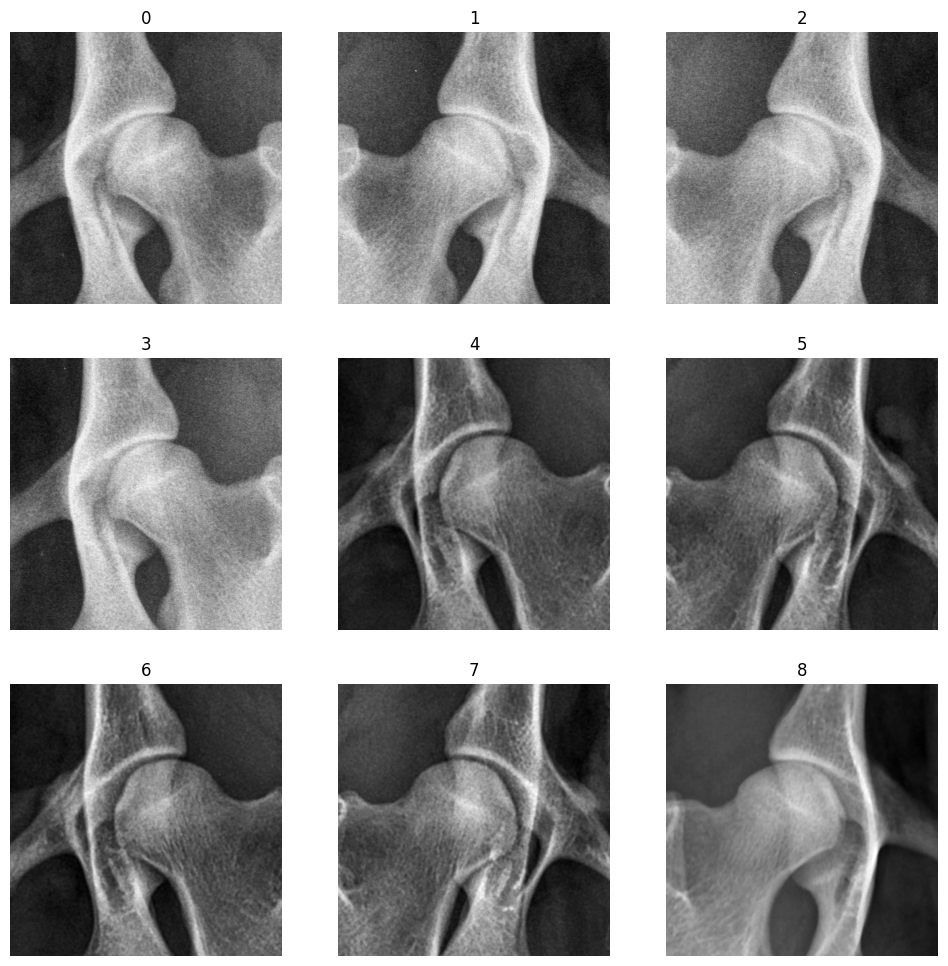

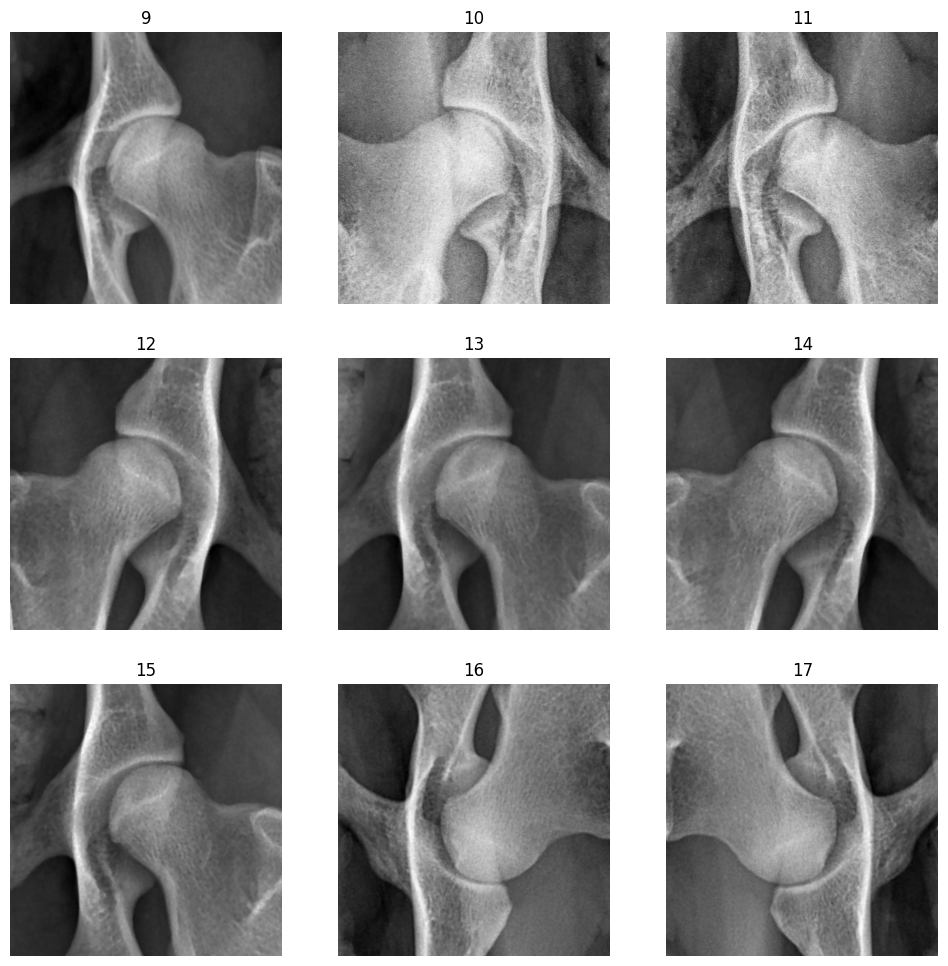

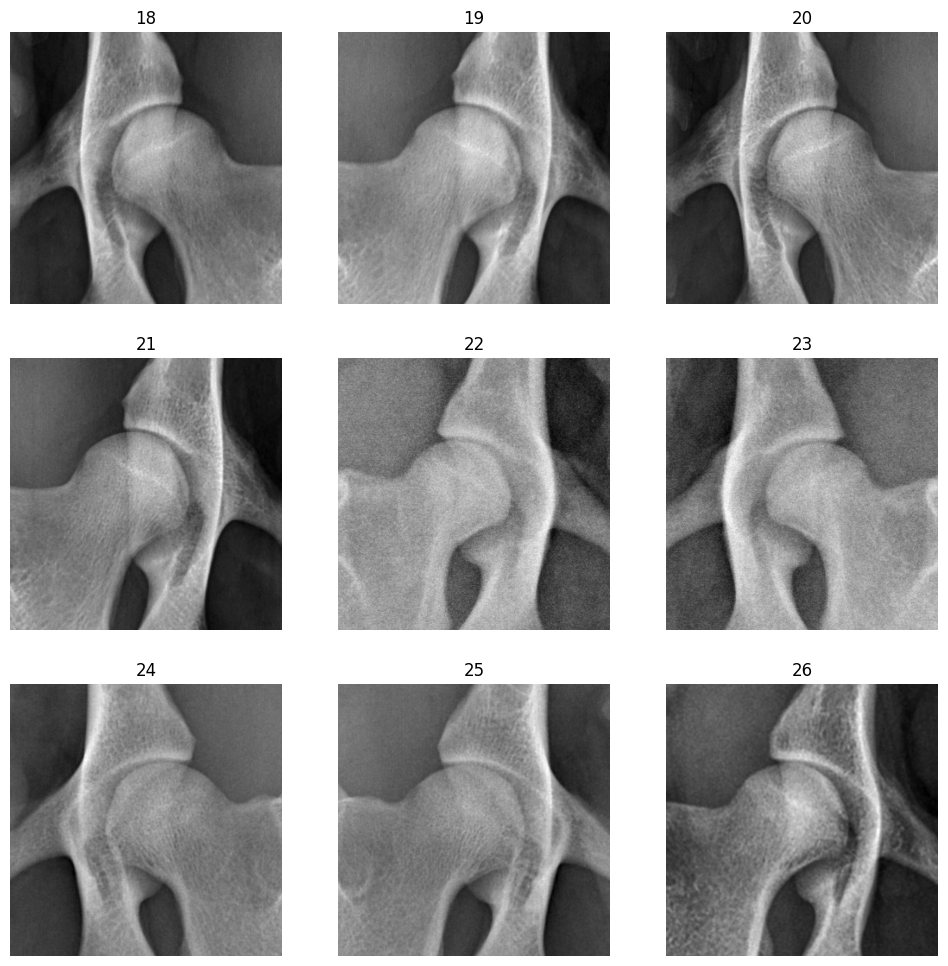

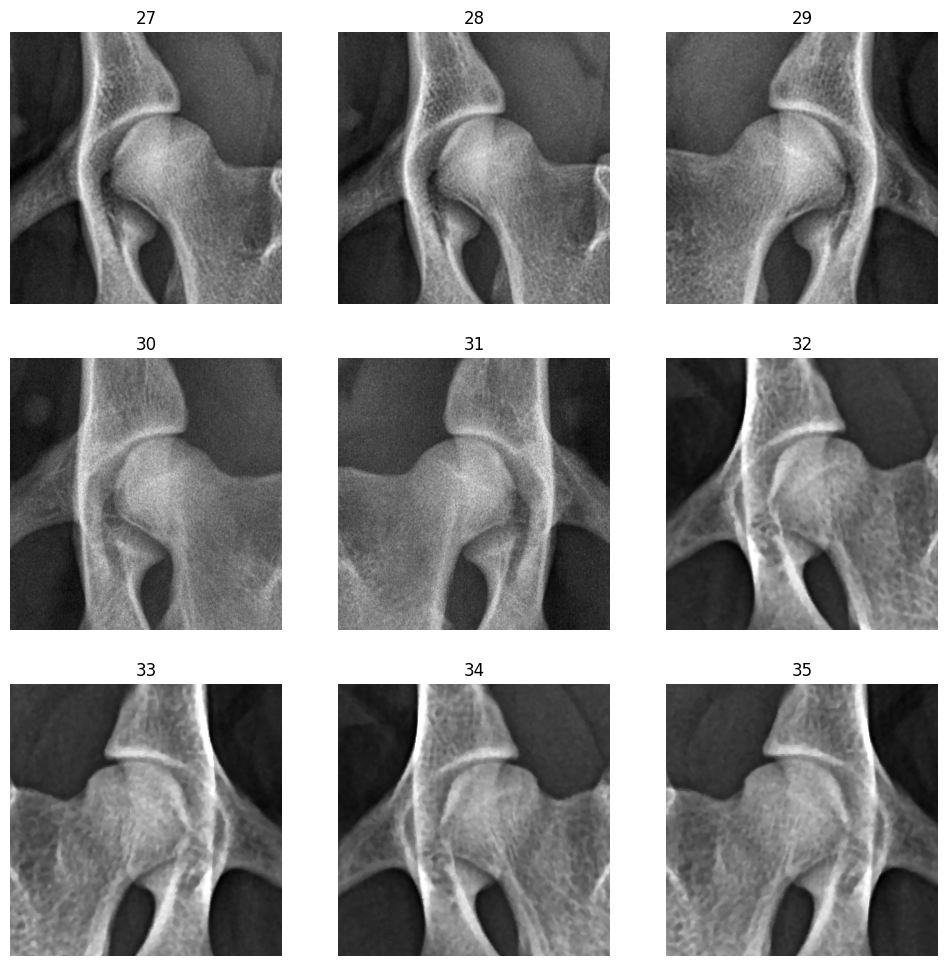

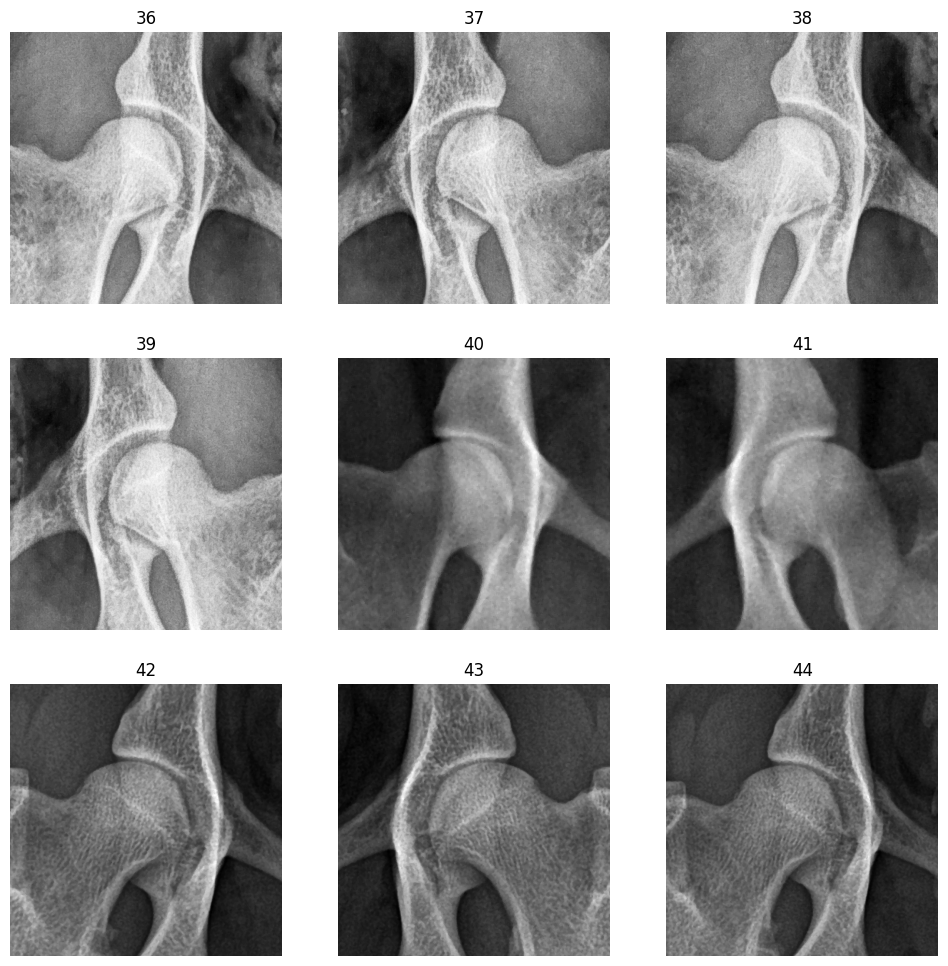

...

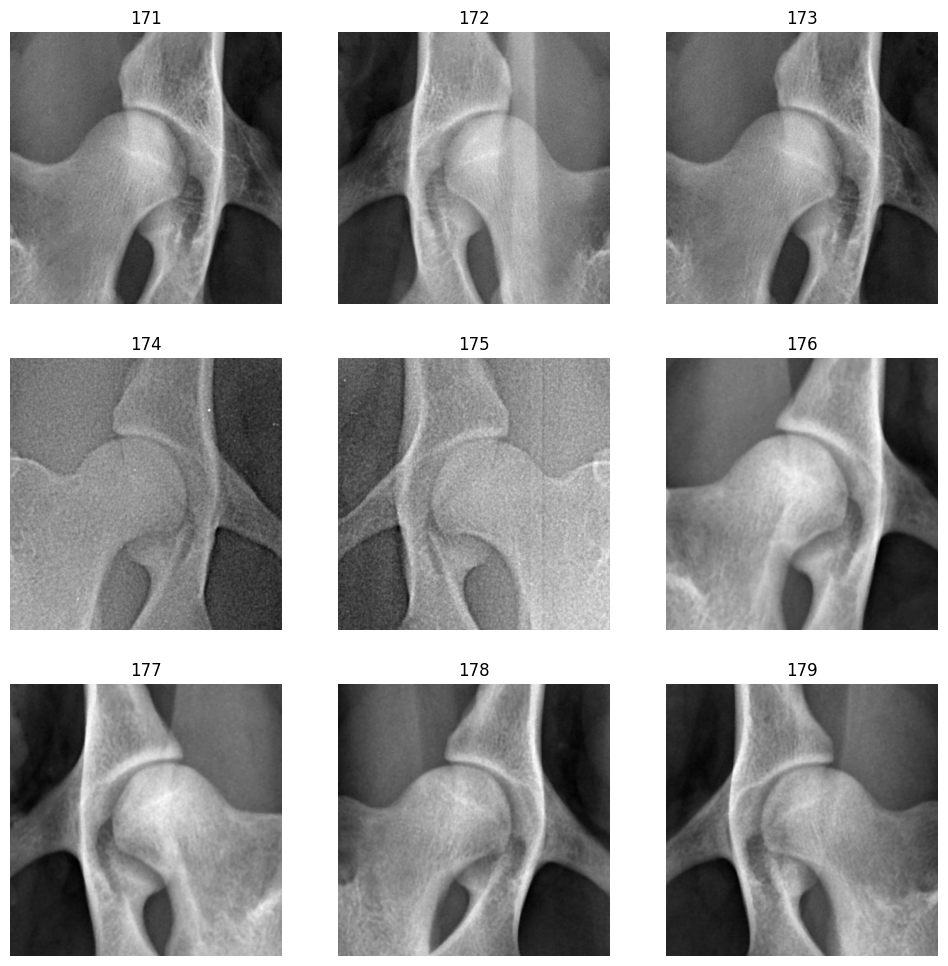

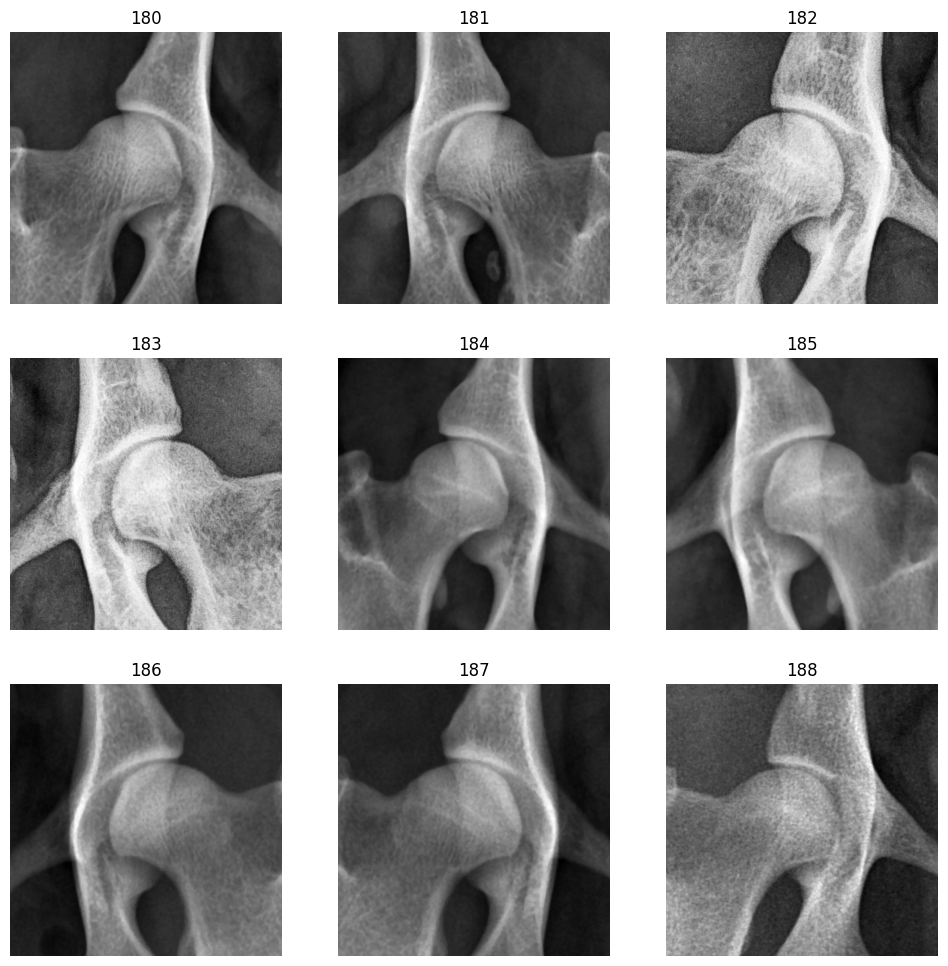

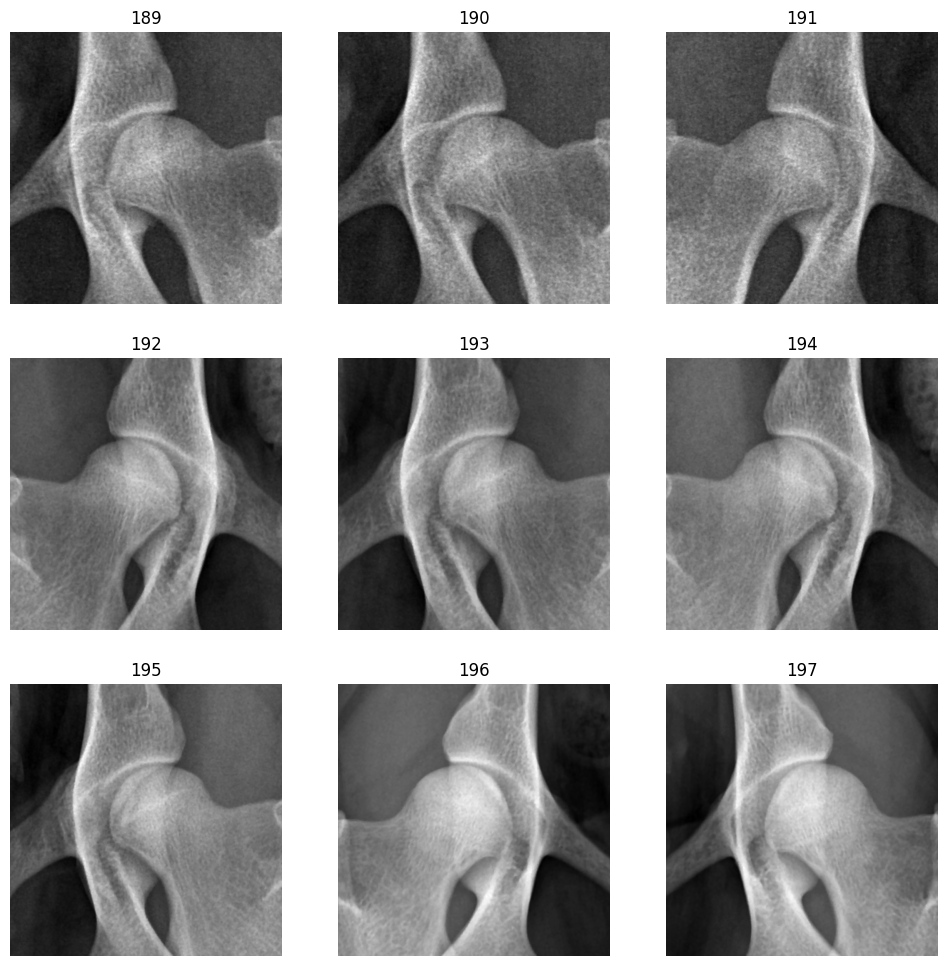

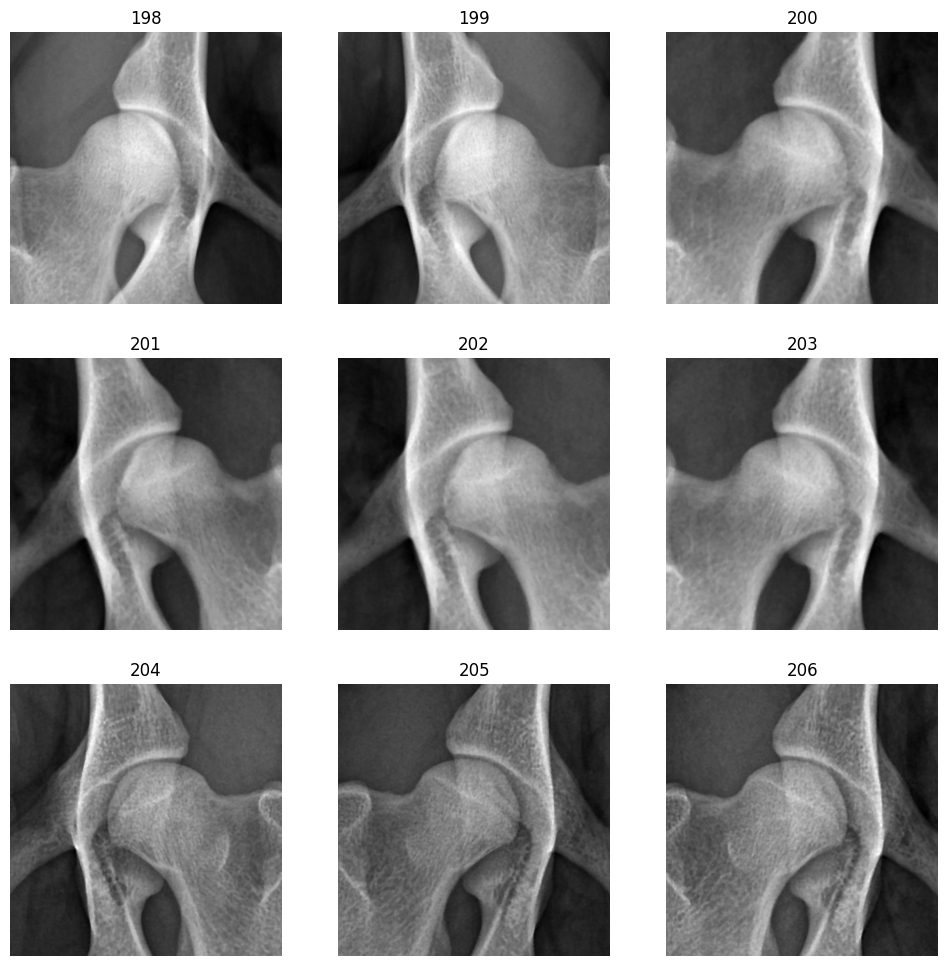

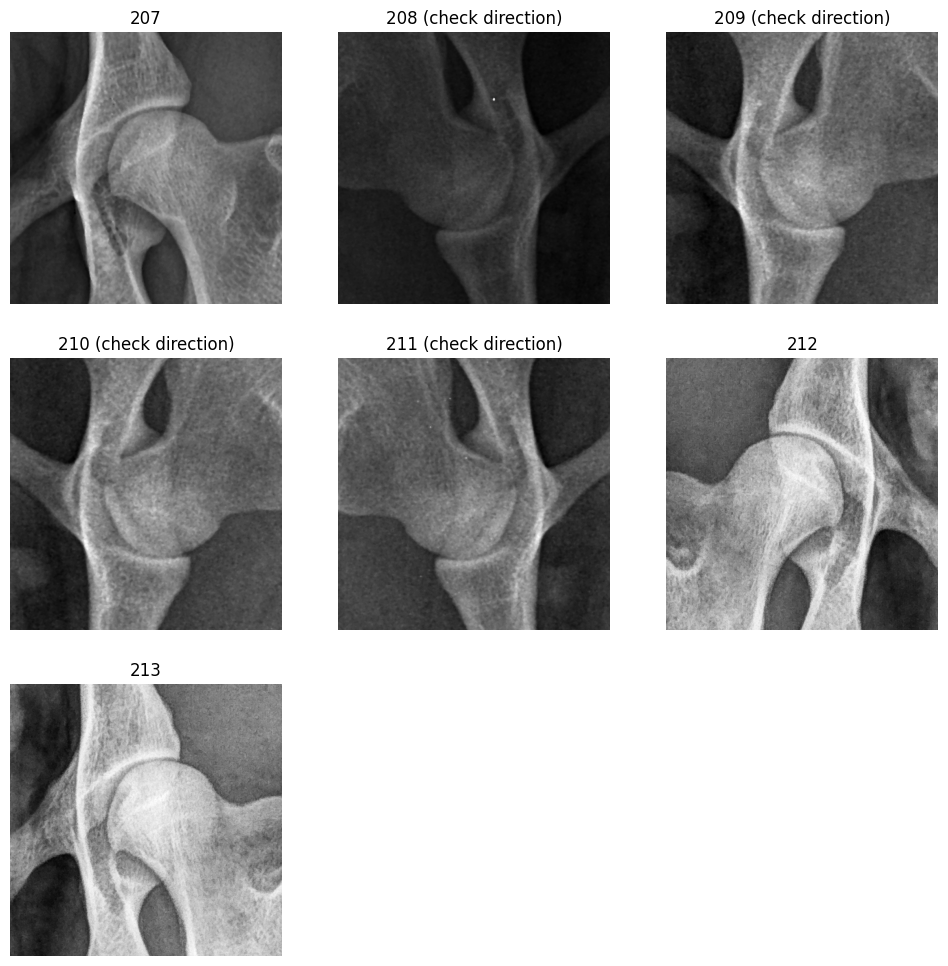

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [208, 209, 210, 211]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = []
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1-22119035,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1513,1782,2075,2266,0.992534,False,1,BB,False
1,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1-22119035,1.3.51.0.7.11316440807.46857.35136.37570.53890...,1527,1797,1187,1378,0.991296,False,1,BB,False
2,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1-22119035,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1441,1708,1211,1400,0.973984,False,1,BB,False
3,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1-22119035,1.3.51.0.7.1446177761.44645.9029.35234.54355.3...,1452,1721,2096,2290,0.956258,False,1,BB,False
4,P:/CoxaAI/Sortering 1/BB,1.3.6.1.4.1.19179.1.14424093474161.3.27928.816...,1-22119092,1.3.6.1.4.1.19179.1.14424093474161.3.27928.816...,927,1115,1437,1575,0.961977,False,1,BB,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
209,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92353.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92353.0.0.dcm_h2,1933,2148,1920,2078,0.952757,True,1,BB,True
210,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92711.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92711.0.0.dcm_h1,2019,2225,1978,2130,0.774347,True,1,BB,True
211,P:/CoxaAI/Sortering 1/BB,1.2.276.0.95.17407.20230111.92711.0.0.dcm,1-23002859,1.2.276.0.95.17407.20230111.92711.0.0.dcm_h2,2023,2230,1198,1353,0.646367,True,1,BB,True
212,P:/CoxaAI/Sortering 1/BB,1.3.51.0.7.12628446692.17076.9027.43213.29613....,1-23002909,1.3.51.0.7.12628446692.17076.9027.43213.29613....,1082,1269,557,695,0.985946,False,1,BB,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
new_detection_df.shape

(214, 13)

In [13]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]
print(new_detection_df.shape)

(214, 13)


In [14]:
new_detection_df.to_csv(filename_clean, index=False)

In [15]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
